# Лабораторная работа 1

**Датасет** `Job_Placement_Data_Enhanced.csv`

In [1]:
#!pip install numpy pandas scikit-learn matplotlib seaborn plotly

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

Загрузка и первичный анализ данных

In [3]:
df = pd.read_csv('./Job_Placement_Data_Enhanced.csv')

df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 215 entries, 0 to 214
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 215 non-null    object 
 1   ssc_percentage         215 non-null    float64
 2   ssc_board              215 non-null    object 
 3   hsc_percentage         215 non-null    float64
 4   hsc_board              215 non-null    object 
 5   hsc_subject            215 non-null    object 
 6   degree_percentage      215 non-null    float64
 7   undergrad_degree       215 non-null    object 
 8   work_experience        215 non-null    object 
 9   emp_test_percentage    215 non-null    float64
 10  specialisation         215 non-null    object 
 11  mba_percent            215 non-null    float64
 12  status                 215 non-null    object 
 13  years_experience       215 non-null    int64  
 14  skills_match_percent   215 non-null    int64  
 15  num_ce

,ssc_percentage,hsc_percentage,degree_percentage,emp_test_percentage,mba_percent,years_experience,skills_match_percent,num_certifications,internship_completed,interview_score
count,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000
mean,67.303395,66.333163,66.370186,72.100558,62.278186,2.483721,70.413953,2.423256,0.483721,74.046512
std,10.827205,10.897509,7.358743,13.275956,5.833385,1.701694,17.235065,1.708259,0.500901,14.602447
min,40.890000,37.000000,50.000000,50.000000,51.210000,0.000000,40.000000,0.000000,0.000000,50.000000
25%,60.600000,60.900000,61.000000,60.000000,57.945000,1.000000,58.000000,1.000000,0.000000,62.500000
50%,67.000000,65.000000,66.000000,71.000000,62.000000,3.000000,71.000000,3.000000,0.000000,74.000000
75%,75.700000,73.000000,72.000000,83.500000,66.255000,4.000000,86.000000,4.000000,1.000000,86.000000
max,89.400000,97.700000,91.000000,98.000000,77.890000,5.000000,99.000000,5.000000,1.000000,99.000000


In [4]:
df.head()

,gender,ssc_percentage,ssc_board,hsc_percentage,hsc_board,hsc_subject,degree_percentage,undergrad_degree,work_experience,emp_test_percentage,specialisation,mba_percent,status,years_experience,skills_match_percent,num_certifications,internship_completed,interview_score,company_tier,job_competition_level
0,M,67.00,Others,91.00,Others,Commerce,58.00,Sci&Tech,No,55.0,Mkt&HR,58.80,Placed,3,98,1,0,94,Mid,Medium
1,M,79.33,Central,78.33,Others,Science,77.48,Sci&Tech,Yes,86.5,Mkt&Fin,66.28,Placed,4,88,1,1,54,MNC,Low
2,M,65.00,Central,68.00,Central,Arts,64.00,Comm&Mgmt,No,75.0,Mkt&Fin,57.80,Placed,2,41,1,1,82,Startup,Low
3,M,56.00,Central,52.00,Central,Science,52.00,Sci&Tech,No,66.0,Mkt&HR,59.43,Not Placed,4,41,0,0,50,MNC,High
4,M,85.80,Central,73.60,Central,Commerce,73.30,Comm&Mgmt,No,96.8,Mkt&Fin,55.50,Placed,4,67,0,0,67,Mid,High


Датасет содержит 215 образцов и 19 признаков. Пропущенных значений нет. Числовые признаки имеют разные масштабы

Распределение:
status
Placed        148
Not Placed     67
Name: count, dtype: int64


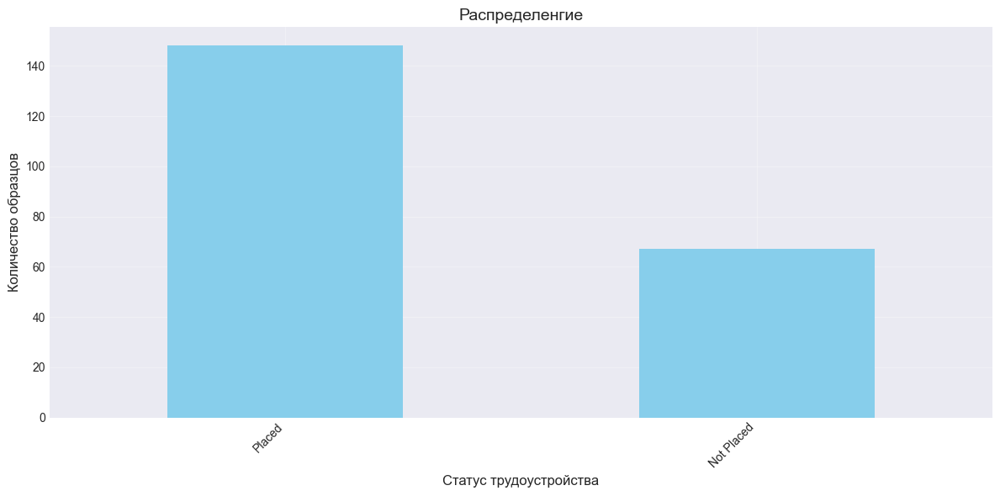

In [5]:
# Распределение классов
print("Распределение:")
print(df['status'].value_counts())

# Визуализация распределения классов
plt.figure(figsize=(12, 6))
df['status'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Распределенгие', fontsize=14)
plt.xlabel('Статус трудоустройства', fontsize=12)
plt.ylabel('Количество образцов', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Датасет плохо сбалансирован. Трудоустроевшихся людей в датасете значительно больше, чем не трудоустроившихся.

Сбалансируем датасет, произведя бутстрап по не трудоустроевшимся

In [6]:
placed = df[df['status'] == 'Placed'].copy()
not_placed = df[df['status'] == 'Not Placed'].copy()
delta = len(placed) - len(not_placed)
df = pd.concat([df, not_placed.sample(n=delta, replace=True)])

Распределение:
status
Placed        148
Not Placed    148
Name: count, dtype: int64


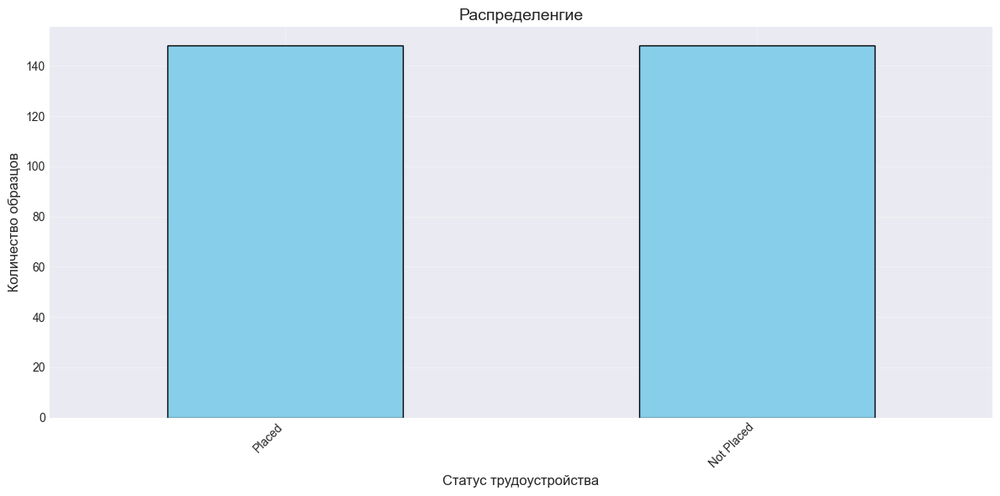

In [7]:
# Распределение классов
print("Распределение:")
print(df['status'].value_counts())

# Визуализация распределения классов
plt.figure(figsize=(12, 6))
df['status'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Распределенгие', fontsize=14)
plt.xlabel('Статус трудоустройства', fontsize=12)
plt.ylabel('Количество образцов', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Визуализация числовых признаков

['ssc_percentage', 'hsc_percentage', 'degree_percentage', 'emp_test_percentage', 'mba_percent', 'years_experience', 'skills_match_percent', 'num_certifications', 'internship_completed', 'interview_score', 'F_F', 'M_M', 'Central_Central', 'Others_Others', 'Arts_Arts', 'Commerce_Commerce', 'Science_Science', 'Comm&Mgmt_Comm&Mgmt', 'Sci&Tech_Sci&Tech', 'No_No', 'Yes_Yes', 'Mkt&Fin_Mkt&Fin', 'Mkt&HR_Mkt&HR', 'MNC_MNC', 'Mid_Mid', 'Startup_Startup', 'High_High', 'Low_Low', 'Medium_Medium']


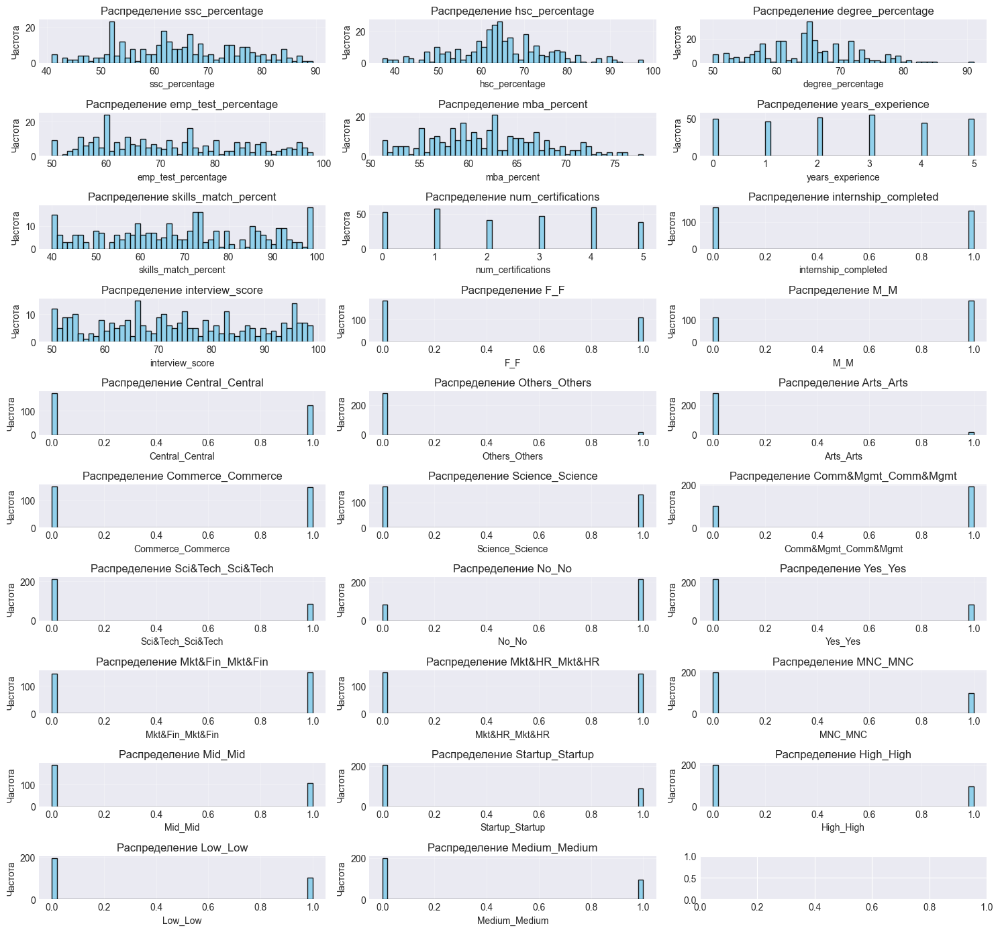

In [8]:
import itertools
from sklearn.preprocessing import OneHotEncoder

object_cols = [t for t in df.select_dtypes(include='object').columns.to_list() if t != 'status']
for col in object_cols:
    cats = np.unique(df[col].values)
    l_enc = OneHotEncoder().fit(cats.reshape(1, -1))
    encoded_names = l_enc.get_feature_names_out(cats)
    for cat, name in zip(cats, encoded_names):
        df[name] = (df[col] == cat).astype(int)

# выбор числовых признаков
numeric_cols = df.select_dtypes(include='number').columns.to_list()
print(numeric_cols)

# гистограммы распределения
fig, axes = plt.subplots(len(numeric_cols) // 3 + 1, 3, figsize=(15, 14))
# iter_axis = (axes[i][j] for i in range(len(numeric_cols) // 3 + 1) for j in range(3))

for ax, col in zip(itertools.chain(*axes), numeric_cols, strict=False):
    ax.hist(df[col], bins=50, color='skyblue', edgecolor='black', alpha=0.9)
    ax.set_title(f'Распределение {col}', fontsize=12)
    ax.set_xlabel(col, fontsize=10)
    ax.set_ylabel('Частота', fontsize=10)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

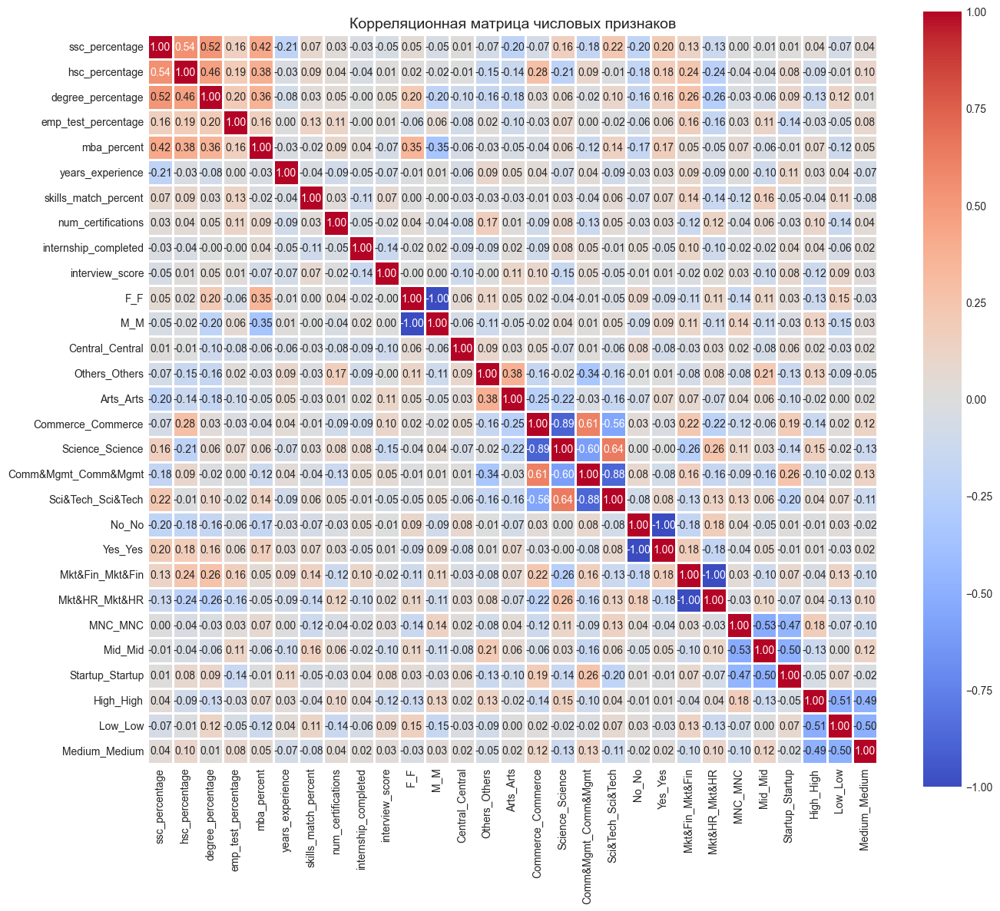

In [9]:
# корреляционная матрица
plt.figure(figsize=(14, 12))
correlation_matrix = df[numeric_cols].corr()
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            square=True, linewidths=1, cbar_kws={"shrink": 1.0})
plt.title('Корреляционная матрица числовых признаков', fontsize=14)
plt.tight_layout()
plt.show()

Оценки за все года обучения (средняя, старшая школы и тд.) сильно коррелируют.

In [10]:
# Парные графики
sample_df = df
sns.pairplot(sample_df[numeric_cols + ['status']], hue='status',
             plot_kws={'alpha': 0.6, 's': 30})
plt.suptitle('Парные графики числовых признаков', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

Предобработка данных

In [11]:
# выбор числовых признаков для PCA
X = df[numeric_cols].values
y = df['status'].values

# кодирование целевой переменной
le = LabelEncoder()
y_encoded = le.fit_transform(y)

label_names = {i: name for i, name in enumerate(le.classes_)}

print(f"Форма данных X: {X.shape}")
print(f"Количество классов: {len(np.unique(y))}")
print(f"Классы: {le.classes_}")

# стандартизация данных (для PCA)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Форма данных X: (296, 29)
Количество классов: 2
Классы: ['Not Placed' 'Placed']


Данные стандартизированы (среднее = 0, std = 1). это необходимо для корректной работы PCA из-за разных масштабов признаков

#### анализ дисперсии

In [12]:
# PCA со всеми компонентами для анализа
pca_full = PCA(random_state=42)
pca_full.fit(X_scaled)

explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

print("Объясненная дисперсия по компонентам:")
for i, var in enumerate(explained_variance):
    print(f"  PC{i+1}: {var:.4f} ({var*100:.2f}%)")

print(f"\nКумулятивная дисперсия:")
for i, cum_var in enumerate(cumulative_variance):
    print(f"  PC1–PC{i+1}: {cum_var:.4f} ({cum_var*100:.2f}%)")

Объясненная дисперсия по компонентам:
  PC1: 0.1259 (12.59%)
  PC2: 0.1107 (11.07%)
  PC3: 0.0877 (8.77%)
  PC4: 0.0696 (6.96%)
  PC5: 0.0661 (6.61%)
  PC6: 0.0599 (5.99%)
  PC7: 0.0545 (5.45%)
  PC8: 0.0473 (4.73%)
  PC9: 0.0450 (4.50%)
  PC10: 0.0406 (4.06%)
  PC11: 0.0395 (3.95%)
  PC12: 0.0359 (3.59%)
  PC13: 0.0317 (3.17%)
  PC14: 0.0307 (3.07%)
  PC15: 0.0283 (2.83%)
  PC16: 0.0258 (2.58%)
  PC17: 0.0230 (2.30%)
  PC18: 0.0195 (1.95%)
  PC19: 0.0193 (1.93%)
  PC20: 0.0147 (1.47%)
  PC21: 0.0132 (1.32%)
  PC22: 0.0111 (1.11%)
  PC23: 0.0000 (0.00%)
  PC24: 0.0000 (0.00%)
  PC25: 0.0000 (0.00%)
  PC26: 0.0000 (0.00%)
  PC27: 0.0000 (0.00%)
  PC28: 0.0000 (0.00%)
  PC29: 0.0000 (0.00%)

Кумулятивная дисперсия:
  PC1–PC1: 0.1259 (12.59%)
  PC1–PC2: 0.2366 (23.66%)
  PC1–PC3: 0.3243 (32.43%)
  PC1–PC4: 0.3939 (39.39%)
  PC1–PC5: 0.4600 (46.00%)
  PC1–PC6: 0.5199 (51.99%)
  PC1–PC7: 0.5744 (57.44%)
  PC1–PC8: 0.6217 (62.17%)
  PC1–PC9: 0.6666 (66.66%)
  PC1–PC10: 0.7073 (70.73%)
  PC1–

Первые несколько компонент плохо объясняют данные, мы обязаны взять ~10 компонент

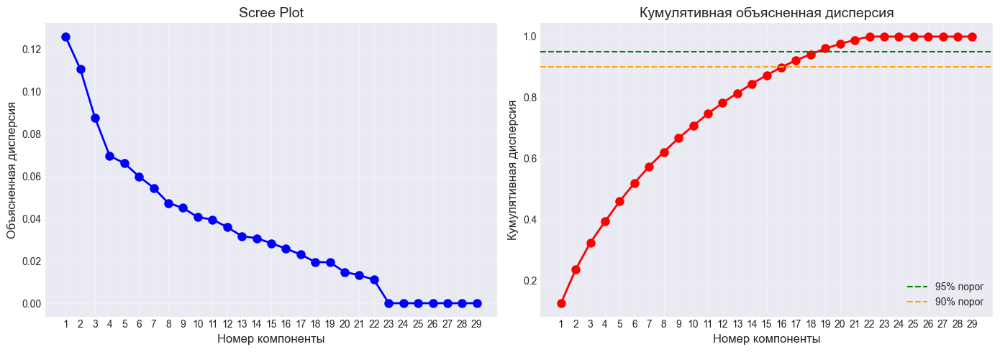

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Scree plot
axes[0].plot(range(1, len(explained_variance) + 1), explained_variance,
             'bo-', linewidth=2, markersize=8)
axes[0].set_xlabel('Номер компоненты', fontsize=12)
axes[0].set_ylabel('Объясненная дисперсия', fontsize=12)
axes[0].set_title('Scree Plot', fontsize=14)
axes[0].grid(True, alpha=0.3)
axes[0].set_xticks(range(1, len(explained_variance) + 1))

# Кумулятивная дисперсия
axes[1].plot(range(1, len(cumulative_variance) + 1), cumulative_variance,
             'ro-', linewidth=2, markersize=8)
axes[1].axhline(y=0.95, color='green', linestyle='--', label='95% порог')
axes[1].axhline(y=0.90, color='orange', linestyle='--', label='90% порог')
axes[1].set_xlabel('Номер компоненты', fontsize=12)
axes[1].set_ylabel('Кумулятивная дисперсия', fontsize=12)
axes[1].set_title('Кумулятивная объясненная дисперсия', fontsize=14)
axes[1].grid(True, alpha=0.3)
axes[1].legend()
axes[1].set_xticks(range(1, len(cumulative_variance) + 1))

plt.tight_layout()
plt.show()

Будем барть не все компоненты, а только 15 первых, они объясняют 90% дисперсии

2д и 3д визуализация

PC1: 0.1259 (12.59%)
PC2: 0.1107 (11.07%)
...
Суммарно: 0.6217 (62.17%)


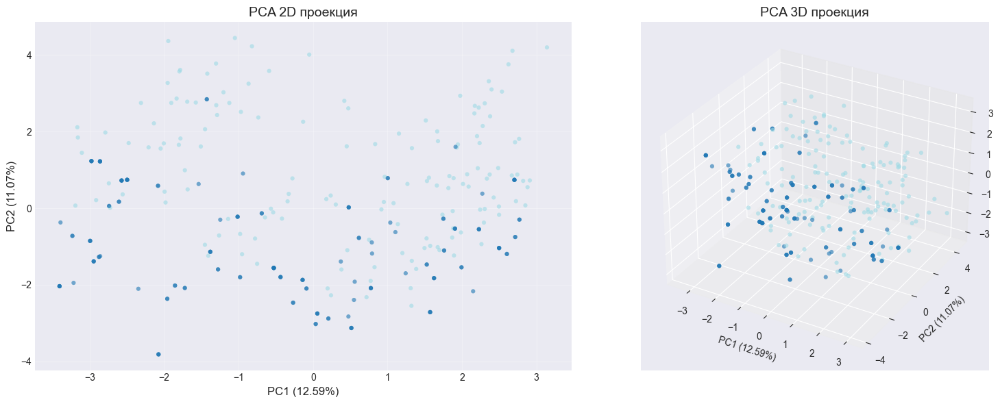

In [14]:
# PCA с 3 компонентами для 2д и 3д визуализации
pca8 = PCA(n_components=8, random_state=42)
X_pca8 = pca8.fit_transform(X_scaled)

ev = pca8.explained_variance_ratio_
print(f"PC1: {ev[0]:.4f} ({ev[0]*100:.2f}%)")
print(f"PC2: {ev[1]:.4f} ({ev[1]*100:.2f}%)")
print("...")
print(f"Суммарно: {ev.sum():.4f} ({ev.sum()*100:.2f}%)")

fig = plt.figure(figsize=(16, 6))

# 2д
ax1 = fig.add_subplot(121)
scatter = ax1.scatter(X_pca8[:, 0], X_pca8[:, 1], c=y_encoded,
                      cmap='tab20', alpha=0.6, s=20, edgecolors='none')
ax1.set_xlabel(f'PC1 ({ev[0]:.2%})', fontsize=12)
ax1.set_ylabel(f'PC2 ({ev[1]:.2%})', fontsize=12)
ax1.set_title('PCA 2D проекция', fontsize=14)
ax1.grid(True, alpha=0.3)

# 3д
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(X_pca8[:, 0], X_pca8[:, 1], X_pca8[:, 2],
            c=y_encoded, cmap='tab20', alpha=0.6, s=20, edgecolors='none')
ax2.set_xlabel(f'PC1 ({ev[0]:.2%})')
ax2.set_ylabel(f'PC2 ({ev[1]:.2%})')
ax2.set_zlabel(f'PC3 ({ev[2]:.2%})')
ax2.set_title('PCA 3D проекция', fontsize=14)

plt.tight_layout()
plt.show()

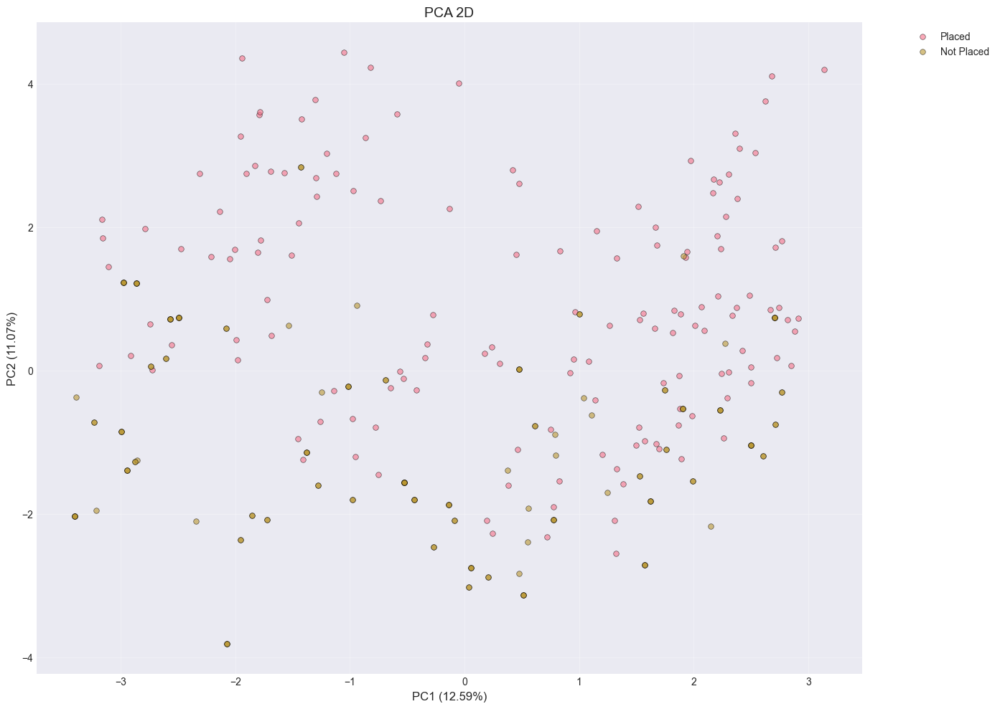

In [15]:
plt.figure(figsize=(14, 10))
for status in ['Placed', 'Not Placed']:
    mask = y == status
    plt.scatter(X_pca8[mask, 0], X_pca8[mask, 1],
                label=status, alpha=0.6, s=30, edgecolors='k', linewidth=0.5)

plt.xlabel(f'PC1 ({ev[0]:.2%})', fontsize=12)
plt.ylabel(f'PC2 ({ev[1]:.2%})', fontsize=12)
plt.title('PCA 2D', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Не трудоустроенные ближе к левому нижнему углу, трудоустроенные наоборот

#### Анализ вклада признаков в главные компоненты

Вклад признаков в главные компоненты:
     ssc_percentage  hsc_percentage  degree_percentage  emp_test_percentage  \
PC1       -0.013252        0.184521           0.089827             0.024163   
PC2        0.399287        0.339092           0.378781             0.181496   
PC3       -0.068595       -0.061994          -0.146745             0.033720   
PC4       -0.144867       -0.093274          -0.159405             0.047572   
PC5       -0.167582       -0.174539           0.005228            -0.099089   
PC6        0.008699       -0.011471          -0.035199            -0.081791   
PC7       -0.044202       -0.065895          -0.031766            -0.344078   
PC8       -0.020918        0.043620           0.030296            -0.012466   

     mba_percent  years_experience  skills_match_percent  num_certifications  \
PC1    -0.013286          0.058192              0.014925           -0.093201   
PC2     0.319994         -0.056036              0.106357            0.043763   
PC3    -0.

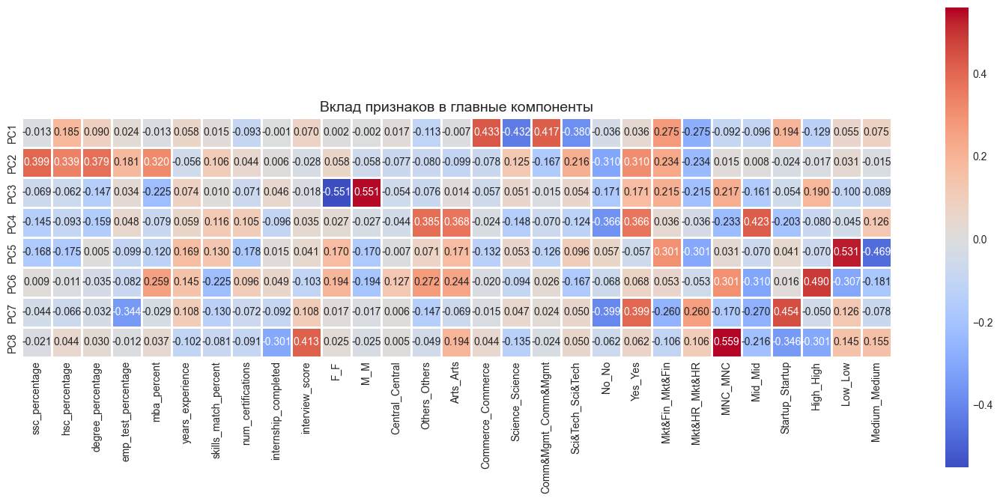

In [22]:
components_df = pd.DataFrame(
    pca8.components_,
    columns=numeric_cols,
    index=[f'PC{i+1}' for i in range(len(pca8.components_,))]
)

print("Вклад признаков в главные компоненты:")
print(components_df)

plt.figure(figsize=(15, 8))
sns.heatmap(components_df, annot=True, fmt='.3f', cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Вклад признаков в главные компоненты', fontsize=14)
plt.tight_layout()
plt.show()

PC1 в основном состоит из выбранного направления на разных этапах обучения (прим. commerce, science, ..). Те кто шли на commerce трудоустроились с большой вероятностью судя по PC1

### многомерная визуализация

In [17]:
from multidim_visualization import HighDimVisualizer

feature_names = numeric_cols
visualizer = HighDimVisualizer(random_state=42)


6. Параллельные координаты


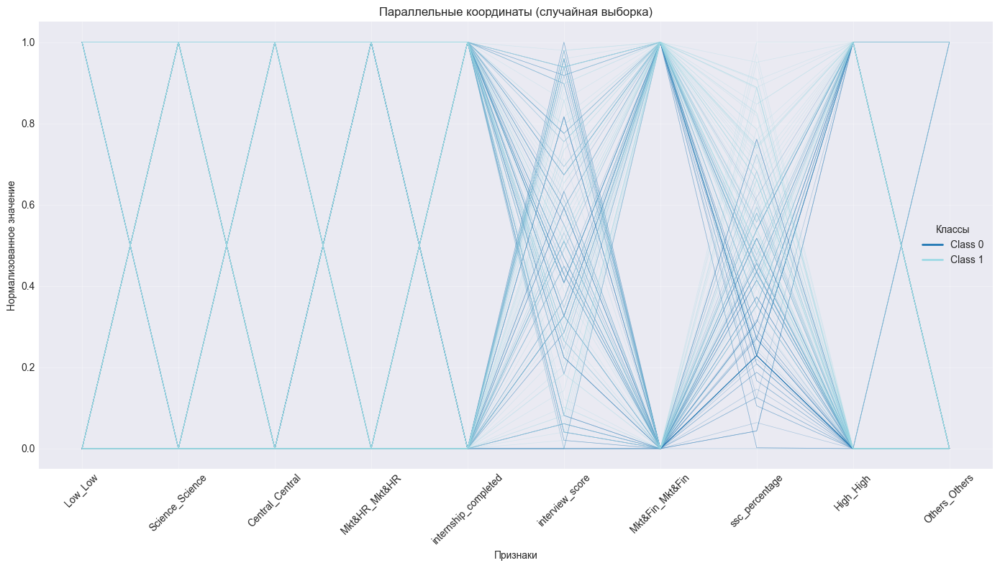

In [18]:
visualizer.plot_parallel_coordinates(X_scaled, y_encoded, feature_names)

#### Радар-чарты по классам


7. Радар-чарты по классам


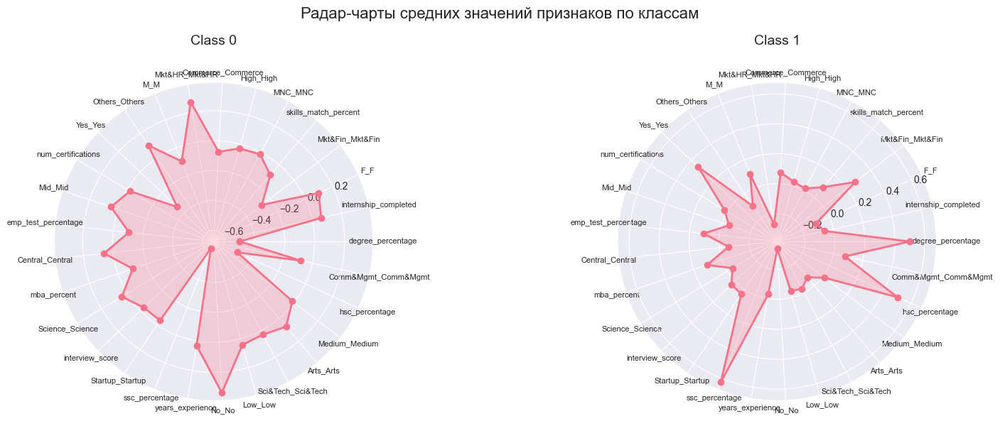

In [23]:
y_seq = le.transform(y)

visualizer.plot_radar_chart(X_scaled, y_seq, feature_names, n_features=len(feature_names))

### 3D визуализация

In [24]:
visualizer.plot_interactive_3d(X_scaled, y_encoded, feature_names)


8. Интерактивная 3D визуализация (откроется в браузере)
  График сохранен в файл: interactive_3d_plot.html


### Сравнение методов понижения размерности


9. Сравнение методов уменьшения размерности
  Применяем PCA...
  Применяем t-SNE...
  Применяем MDS...
  Применяем Isomap...
  Применяем UMAP...


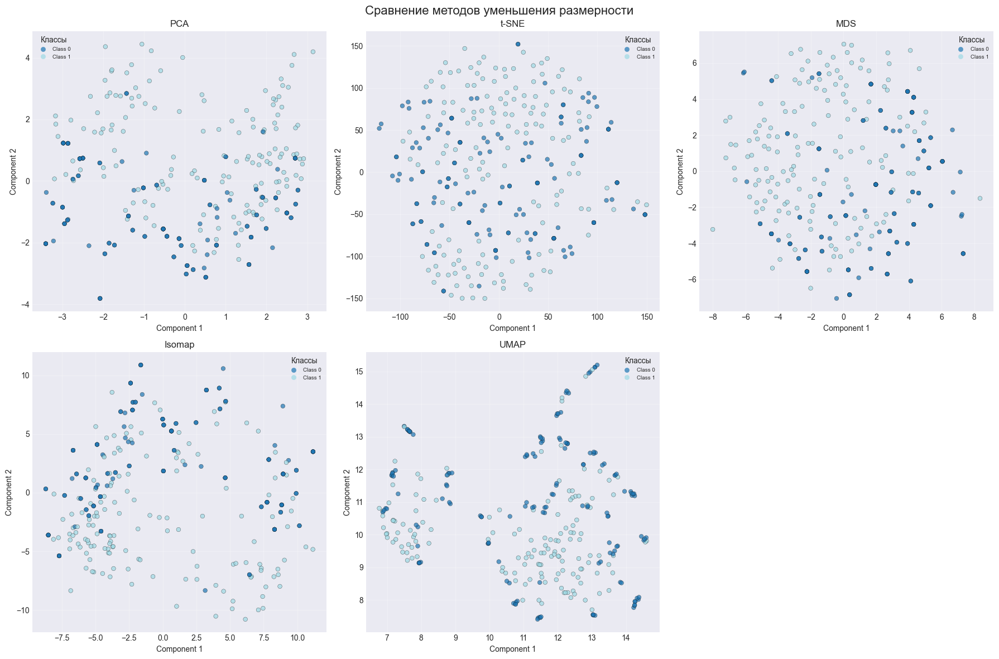

In [21]:
visualizer.compare_dim_reduction_methods(X_scaled, y_encoded)

PCA показывает себя на нашем датасете схоже с t-SNE и MDS. Isomap выделил кластеры, но они не разделяют данные п о целевой переменной.